In [1]:
!pip install opendatasets --upgrade --quiet


In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: uakhitramazanov
Your Kaggle Key: ··········


100%|██████████| 395M/395M [00:09<00:00, 43.6MB/s]


In [3]:
import os

DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [4]:
print(os.listdir(DATA_DIR+'/images')[:10])

['7651_2004.jpg', '62872_2019.jpg', '19998_2007.jpg', '56433_2017.jpg', '30652_2010.jpg', '5917_2003.jpg', '27191_2009.jpg', '47405_2014.jpg', '57330_2017.jpg', '28917_2010.jpg']


In [5]:
"""
Let's load this dataset using the ImageFolder class from torchvision. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range (-1, 1), which is more convenient for training the discriminator. We will also create a data loader to load the data in batches.
"""
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [6]:
"""Let's create helper functions to denormalize the image tensors and display some sample images from a training batch."""
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
from IPython.display import Image

In [8]:
image_size = 64
# image_size = 1
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [9]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [10]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [11]:
   # def show_images(images, nmax=64):
def show_images(images, nmax=1):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    # ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    img = make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0)
    ax.imshow(img)

    # plt.savefig("original/oo.jpg")

# def show_batch(dl, nmax=64):
def show_batch(dl, nmax=1):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


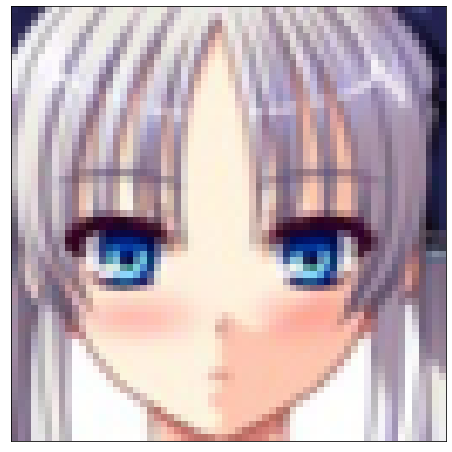

In [12]:
show_batch(train_dl)

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
from torchvision.utils import save_image

directory = '/content/drive/MyDrive/'
original_dir = directory + 'anime_original'
os.makedirs(original_dir, exist_ok=True)

In [15]:
generated_dir = directory + 'generated'
os.makedirs(generated_dir, exist_ok=True)

In [16]:
def save_original(index, images, show=True):
    for item in range(4):
      # xb = torch.randn(batch_size, latent_size, 1, 1)
      # fake_images = generator(latent_tensors)
      print("save 1")

      fname = original_dir + '/original-image-{0}.png'.format(index)
      # fname = 'original-image-{0}.png'.format(index)
      print("save 2")

      # img = make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0)

      img = make_grid(images.cpu().detach(), nrow=8).permute(1, 2, 0)

      save_image(img, os.path.join(original_dir, fname), nrow=8)
      print("save 3")
      print('Saving', fname)
      # if show:
      #     fig, ax = plt.subplots(figsize=(8, 8))
      #     ax.set_xticks([]); ax.set_yticks([])
      #     ax.imshow(make_grid(fake_images.gpu().detach(), nrow=8).permute(1, 2, 0))

In [17]:
def show_images2(images, index, nmax=1):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    # ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    img = make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0)
    ax.imshow(img)

    # imgName = "original/image_{}.jpg".format(index)
    imgName = original_dir + "/image_{}.jpg".format(index)
    plt.savefig(imgName)


In [18]:
# for item in range(4):
#   save_original(0+item, )

In [19]:
def showOriginal(dl, nmax=1):
  i = 0
  for images, _ in dl:
    show_images2(images, i, nmax)
    i+=1
    if i == 16:
      break
    

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


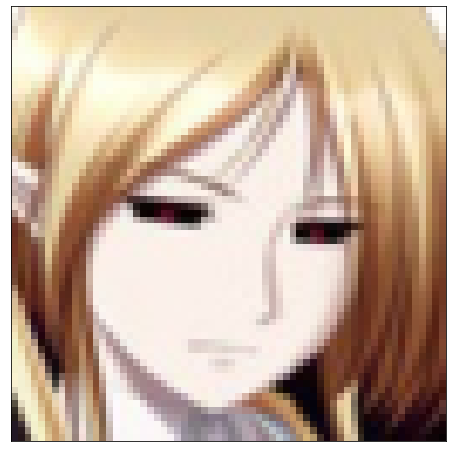

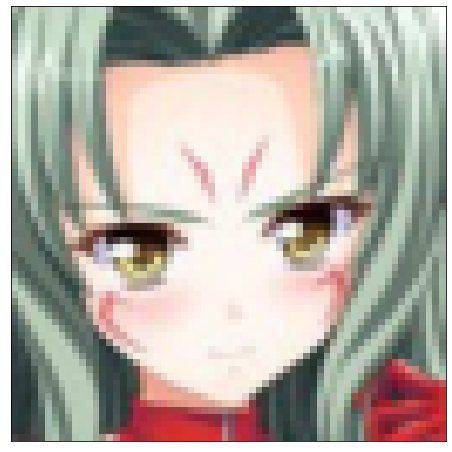

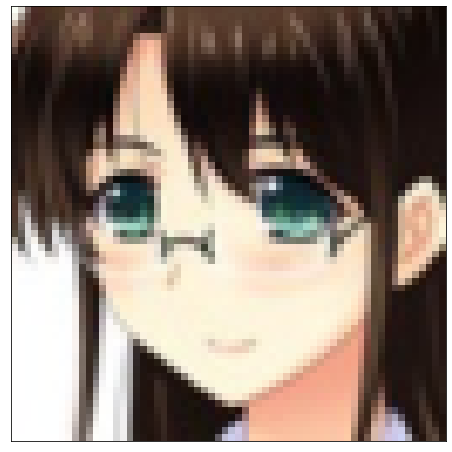

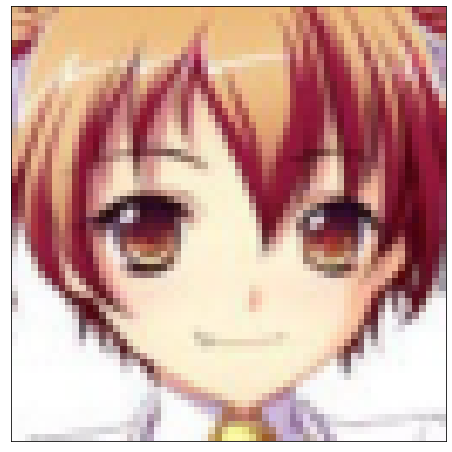

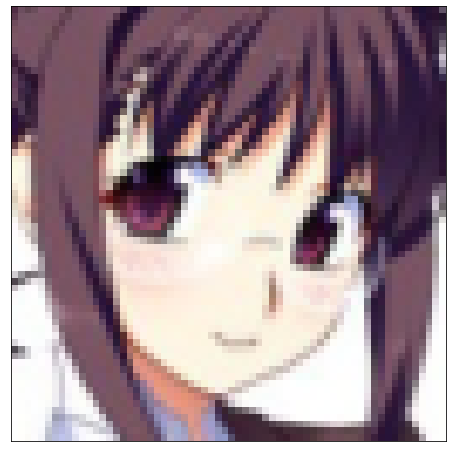

...

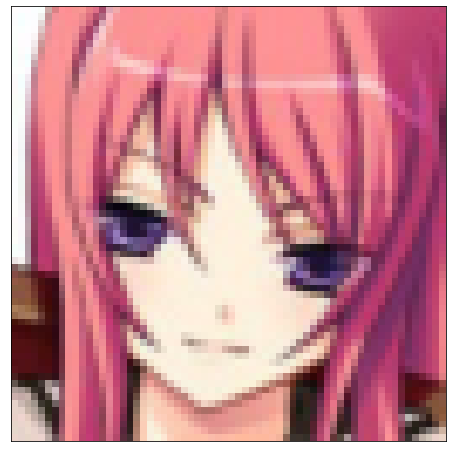

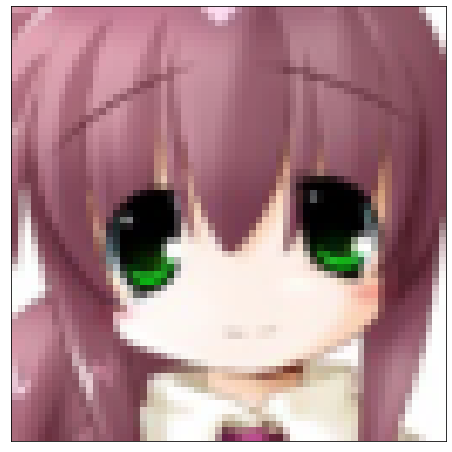

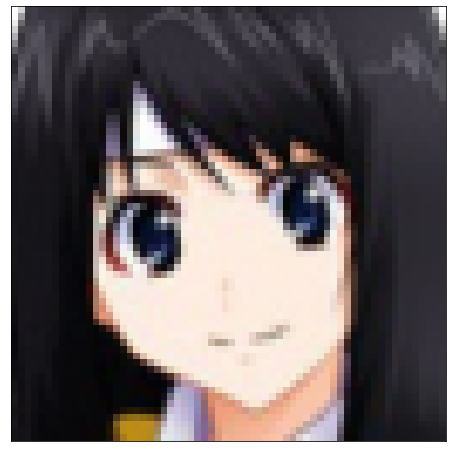

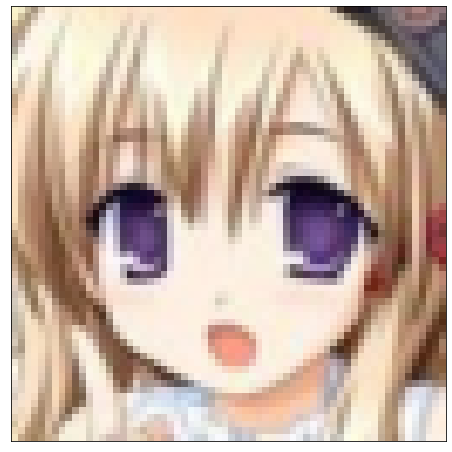

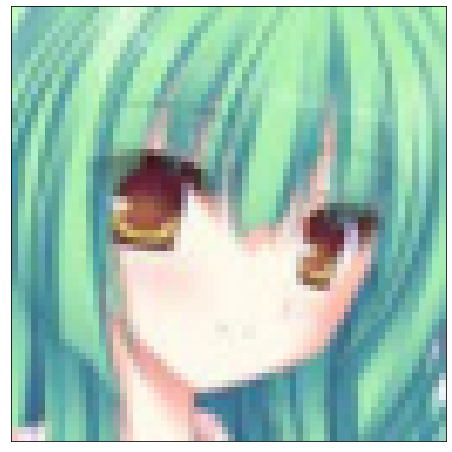

In [20]:
showOriginal(train_dl)

# original

In [21]:
# Using a GPU
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [22]:
device = get_default_device()
device

device(type='cuda')

In [23]:
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network

In [24]:
import torch.nn as nn

In [25]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [26]:
discriminator = to_device(discriminator, device)

## Generator Network

In [27]:
latent_size = 128

In [28]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


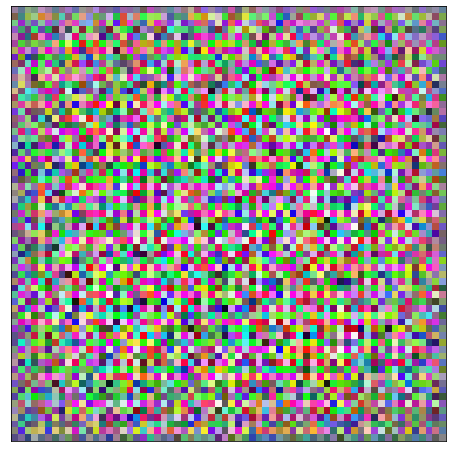

In [29]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

torch.Size([128, 3, 64, 64])


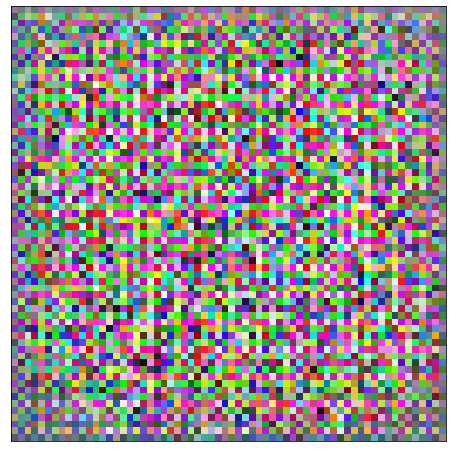

In [30]:
xb2 = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images2 = generator(xb2)
print(fake_images2.shape)
show_images(fake_images2)

In [31]:
generator = to_device(generator, device)

## Discriminator Training

In [32]:
"""Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images."""

def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator. 

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [33]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [34]:
"""Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images."""
from torchvision.utils import save_image

sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [35]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

# Save samples

In [36]:
def save_samples2(index, latent_tensors, epochNum, show=True):
    # for item in range(4):
      # xb = torch.randn(batch_size, latent_size, 1, 1)
      fake_images = generator(latent_tensors)
      # fake_fname = 'generated-images-{0:0=4d}_e{0:1d}.png'.format(index,epochNum)
      
      fake_fname = 'generated-images-{0:0=3d}_e'.format(index)
      suffix = '{0:0=1d}.png'.format(epochNum)
      fake_fname = fake_fname + suffix

      
      save_image(denorm(fake_images), os.path.join(generated_dir, fake_fname), nrow=8)
      # save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
      
      print('Saving', fake_fname)
      if show:
          fig, ax = plt.subplots(figsize=(8, 8))
          ax.set_xticks([]); ax.set_yticks([])
          ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [37]:
fixed_latent3 = torch.randn(1, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-000_e1.png


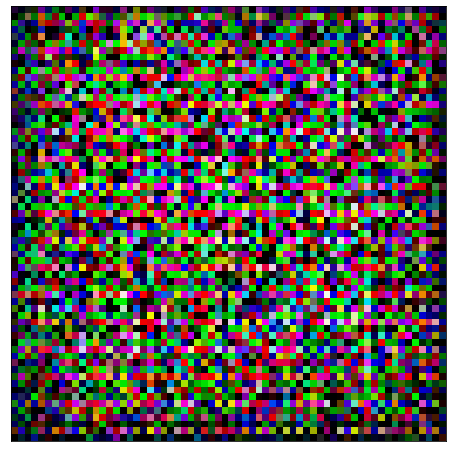

In [38]:
save_samples2(0, fixed_latent3, 1)

In [39]:
# for item in range(4):
#   save_samples2(0+item, fixed_latent3, 2, show=False)

In [40]:
"""
We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.
"""
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


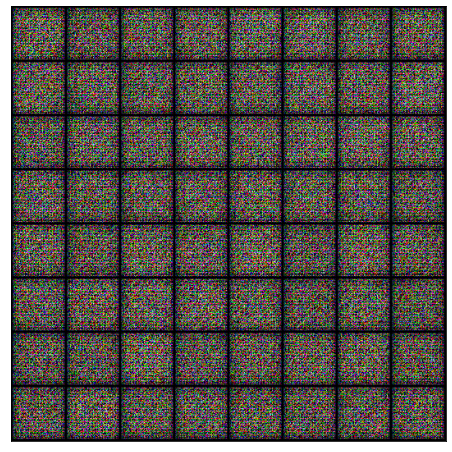

In [41]:
save_samples(0, fixed_latent)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


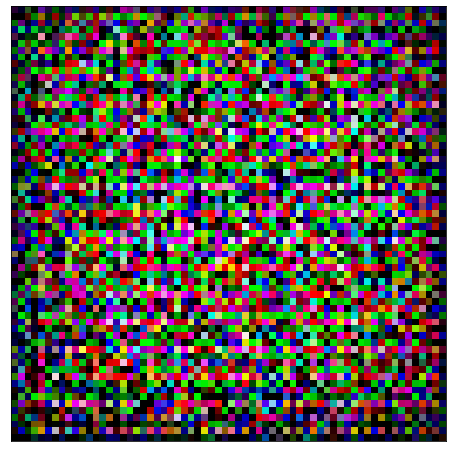

In [42]:
fixed_latent2 = torch.randn(1, latent_size, 1, 1, device=device)
save_samples(0, fixed_latent2)

In [43]:
counter = 0
for item in range(16):
  counter = counter+1
  print("counter = ",counter)

counter =  1
counter =  2
counter =  3
counter =  4
counter =  5
counter =  6
counter =  7
counter =  8
counter =  9
counter =  10
counter =  11
counter =  12
counter =  13
counter =  14
counter =  15
counter =  16


In [44]:
def save_fake(index, epochNum):
    # for item in range(4):
      # xb = torch.randn(batch_size, latent_size, 1, 1)
      # fake_images = generator(latent_tensors)
      # fake_fname = 'generated-images-{0:0=2d}_e'.format(index)
      # suffix = '{0:0=1d}'.format(epochNum)
      # fake_fname = fake_fname + suffix

      fake_fname = 'generated-images-{0:0=3d}_e'.format(index)
      suffix = '{0:0=1d}.png'.format(epochNum)
      fake_fname = fake_fname + suffix

      # save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
      
      print('Saving', fake_fname)

In [45]:

for epoch in range(4):
  counter = 0
  epoch_counter = 0
  for item in range(5):
    counter = counter+1
    # print("counter = ",counter)
    save_fake(item+1, epoch)

Saving generated-images-001_e0.png
Saving generated-images-002_e0.png
Saving generated-images-003_e0.png
Saving generated-images-004_e0.png
Saving generated-images-005_e0.png
Saving generated-images-001_e1.png
Saving generated-images-002_e1.png
Saving generated-images-003_e1.png
Saving generated-images-004_e1.png
Saving generated-images-005_e1.png
Saving generated-images-001_e2.png
Saving generated-images-002_e2.png
Saving generated-images-003_e2.png
Saving generated-images-004_e2.png
Saving generated-images-005_e2.png
Saving generated-images-001_e3.png
Saving generated-images-002_e3.png
Saving generated-images-003_e3.png
Saving generated-images-004_e3.png
Saving generated-images-005_e3.png


In [46]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [47]:
latents = []

for item in range(16):
  fixed_latent4 = torch.randn(1, latent_size, 1, 1, device=device)
  print("***** item =",item)
  print("latent {{item}} =", fixed_latent4)
  latents.append(fixed_latent4)

***** item = 0
latent {{item}} = tensor([[[[-1.7235e-01]],

         [[ 5.2089e-01]],

         [[-1.0691e-01]],

         [[ 1.8014e+00]],

         [[ 1.0459e+00]],

         [[-1.0129e+00]],

         [[-6.5679e-01]],

         [[ 6.2295e-01]],

         [[-7.3304e-01]],

         [[ 1.0020e+00]],

         [[-1.4004e+00]],

         [[ 1.6644e-01]],

         [[-7.8512e-02]],

         [[ 6.8850e-01]],

         [[-9.3073e-01]],

         [[ 4.3409e-01]],

         [[-1.1092e+00]],

         [[-2.2025e-01]],

         [[ 3.4448e-01]],

         [[-5.1742e-01]],

         [[ 2.0542e+00]],

         [[-1.5032e-01]],

         [[-1.3796e+00]],

         [[-1.6881e+00]],

         [[ 1.0360e+00]],

         [[ 2.1231e-01]],

         [[ 6.3449e-01]],

         [[-1.4098e+00]],

         [[ 2.1345e+00]],

         [[ 9.2143e-02]],

         [[-8.8185e-02]],

         [[-2.3456e-01]],

         [[ 1.1464e+00]],

         [[ 3.0546e-01]],

         [[-3.0506e-01]],

         [[-1.2521e+00

In [48]:
# for item in range(41):
#   if item % 5 == 0:
#     print("$$$$$$ yoo item = ",item)
#   print("****** epoch = ",item)

In [49]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        # save_samples(epoch+start_idx, fixed_latent2, show=False)

        # for item in range(16):
        #   save_samples2(epoch+start_idx, fixed_latent2, epoch, show=True) 

        # for item in range(16):
        #   fixed_latent4 = torch.randn(1, latent_size, 1, 1, device=device)
        #   save_samples2(item+1, fixed_latent4, epoch, show=True)

        ### To save images every 5 epochs
        # for item in range(41):
        #   if item % 5 == 0:
        #     for item in range(16):
        #       save_samples2(item+1, latents[item], epoch, show=True)

        for item in range(16):
          latent = latents[item]
          save_samples2(item+1, latent, epoch, show=True)


        # fixed_latent5 = torch.randn(1, latent_size, 1, 1, device=device)
        # save_samples2(epoch+start_idx+200, fixed_latent5, epoch, show=True)

        # fixed_latent6 = torch.randn(1, latent_size, 1, 1, device=device)
        # save_samples2(epoch+start_idx+300, fixed_latent6, epoch, show=True)
         
         
          # save_samples2(0+item, fixed_latent2, 5, show=True)
    
    return losses_g, losses_d, real_scores, fake_scores

In [50]:
"""We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator."""
lr = 0.0002
epochs = 40

# Fit

  0%|          | 0/497 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integ

Epoch [1/40], loss_g: 3.9287, loss_d: 0.5498, real_score: 0.7494, fake_score: 0.1604
Saving generated-images-001_e0.png
Saving generated-images-002_e0.png
Saving generated-images-003_e0.png
Saving generated-images-004_e0.png
Saving generated-images-005_e0.png
Saving generated-images-006_e0.png
Saving generated-images-007_e0.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-008_e0.png
Saving generated-images-009_e0.png
Saving generated-images-010_e0.png
Saving generated-images-011_e0.png
Saving generated-images-012_e0.png
Saving generated-images-013_e0.png
Saving generated-images-014_e0.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-015_e0.png
Saving generated-images-016_e0.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [2/40], loss_g: 3.1803, loss_d: 0.5912, real_score: 0.7874, fake_score: 0.2549
Saving generated-images-001_e1.png
Saving generated-images-002_e1.png
Saving generated-images-003_e1.png
Saving generated-images-004_e1.png
Saving generated-images-005_e1.png
Saving generated-images-006_e1.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e1.png
Saving generated-images-008_e1.png
Saving generated-images-009_e1.png
Saving generated-images-010_e1.png
Saving generated-images-011_e1.png
Saving generated-images-012_e1.png
Saving generated-images-013_e1.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e1.png
Saving generated-images-015_e1.png
Saving generated-images-016_e1.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [3/40], loss_g: 3.6403, loss_d: 0.2288, real_score: 0.8351, fake_score: 0.0154
Saving generated-images-001_e2.png
Saving generated-images-002_e2.png
Saving generated-images-003_e2.png
Saving generated-images-004_e2.png
Saving generated-images-005_e2.png
Saving generated-images-006_e2.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e2.png
Saving generated-images-008_e2.png
Saving generated-images-009_e2.png
Saving generated-images-010_e2.png
Saving generated-images-011_e2.png
Saving generated-images-012_e2.png
Saving generated-images-013_e2.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e2.png
Saving generated-images-015_e2.png
Saving generated-images-016_e2.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [4/40], loss_g: 4.2543, loss_d: 0.4232, real_score: 0.8039, fake_score: 0.1338
Saving generated-images-001_e3.png
Saving generated-images-002_e3.png
Saving generated-images-003_e3.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-004_e3.png
Saving generated-images-005_e3.png
Saving generated-images-006_e3.png
Saving generated-images-007_e3.png
Saving generated-images-008_e3.png
Saving generated-images-009_e3.png
Saving generated-images-010_e3.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-011_e3.png
Saving generated-images-012_e3.png
Saving generated-images-013_e3.png
Saving generated-images-014_e3.png
Saving generated-images-015_e3.png
Saving generated-images-016_e3.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/40], loss_g: 5.0316, loss_d: 0.3025, real_score: 0.9286, fake_score: 0.1881
Saving generated-images-001_e4.png
Saving generated-images-002_e4.png
Saving generated-images-003_e4.png
Saving generated-images-004_e4.png
Saving generated-images-005_e4.png
Saving generated-images-006_e4.png
Saving generated-images-007_e4.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-008_e4.png
Saving generated-images-009_e4.png
Saving generated-images-010_e4.png
Saving generated-images-011_e4.png
Saving generated-images-012_e4.png
Saving generated-images-013_e4.png
Saving generated-images-014_e4.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-015_e4.png
Saving generated-images-016_e4.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [6/40], loss_g: 5.3153, loss_d: 0.7140, real_score: 0.6303, fake_score: 0.0145
Saving generated-images-001_e5.png
Saving generated-images-002_e5.png
Saving generated-images-003_e5.png
Saving generated-images-004_e5.png
Saving generated-images-005_e5.png
Saving generated-images-006_e5.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e5.png
Saving generated-images-008_e5.png
Saving generated-images-009_e5.png
Saving generated-images-010_e5.png
Saving generated-images-011_e5.png
Saving generated-images-012_e5.png
Saving generated-images-013_e5.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e5.png
Saving generated-images-015_e5.png
Saving generated-images-016_e5.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [7/40], loss_g: 8.9551, loss_d: 0.4723, real_score: 0.9563, fake_score: 0.3135
Saving generated-images-001_e6.png
Saving generated-images-002_e6.png
Saving generated-images-003_e6.png
Saving generated-images-004_e6.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-005_e6.png
Saving generated-images-006_e6.png
Saving generated-images-007_e6.png
Saving generated-images-008_e6.png
Saving generated-images-009_e6.png
Saving generated-images-010_e6.png
Saving generated-images-011_e6.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-012_e6.png
Saving generated-images-013_e6.png
Saving generated-images-014_e6.png
Saving generated-images-015_e6.png
Saving generated-images-016_e6.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [8/40], loss_g: 4.2443, loss_d: 0.2082, real_score: 0.8635, fake_score: 0.0359
Saving generated-images-001_e7.png
Saving generated-images-002_e7.png
Saving generated-images-003_e7.png
Saving generated-images-004_e7.png
Saving generated-images-005_e7.png
Saving generated-images-006_e7.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e7.png
Saving generated-images-008_e7.png
Saving generated-images-009_e7.png
Saving generated-images-010_e7.png
Saving generated-images-011_e7.png
Saving generated-images-012_e7.png
Saving generated-images-013_e7.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e7.png
Saving generated-images-015_e7.png
Saving generated-images-016_e7.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [9/40], loss_g: 4.8255, loss_d: 0.4157, real_score: 0.7140, fake_score: 0.0024
Saving generated-images-001_e8.png
Saving generated-images-002_e8.png
Saving generated-images-003_e8.png
Saving generated-images-004_e8.png
Saving generated-images-005_e8.png
Saving generated-images-006_e8.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e8.png
Saving generated-images-008_e8.png
Saving generated-images-009_e8.png
Saving generated-images-010_e8.png
Saving generated-images-011_e8.png
Saving generated-images-012_e8.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e8.png
Saving generated-images-014_e8.png
Saving generated-images-015_e8.png
Saving generated-images-016_e8.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [10/40], loss_g: 2.4302, loss_d: 1.2803, real_score: 0.4041, fake_score: 0.0006
Saving generated-images-001_e9.png
Saving generated-images-002_e9.png
Saving generated-images-003_e9.png
Saving generated-images-004_e9.png
Saving generated-images-005_e9.png
Saving generated-images-006_e9.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e9.png
Saving generated-images-008_e9.png
Saving generated-images-009_e9.png
Saving generated-images-010_e9.png
Saving generated-images-011_e9.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-012_e9.png
Saving generated-images-013_e9.png
Saving generated-images-014_e9.png
Saving generated-images-015_e9.png
Saving generated-images-016_e9.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [11/40], loss_g: 4.2005, loss_d: 0.2773, real_score: 0.8119, fake_score: 0.0136
Saving generated-images-001_e10.png
Saving generated-images-002_e10.png
Saving generated-images-003_e10.png
Saving generated-images-004_e10.png
Saving generated-images-005_e10.png
Saving generated-images-006_e10.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e10.png
Saving generated-images-008_e10.png
Saving generated-images-009_e10.png
Saving generated-images-010_e10.png
Saving generated-images-011_e10.png
Saving generated-images-012_e10.png
Saving generated-images-013_e10.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e10.png
Saving generated-images-015_e10.png
Saving generated-images-016_e10.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [12/40], loss_g: 4.3507, loss_d: 0.6445, real_score: 0.6006, fake_score: 0.0031
Saving generated-images-001_e11.png
Saving generated-images-002_e11.png
Saving generated-images-003_e11.png
Saving generated-images-004_e11.png
Saving generated-images-005_e11.png
Saving generated-images-006_e11.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e11.png
Saving generated-images-008_e11.png
Saving generated-images-009_e11.png
Saving generated-images-010_e11.png
Saving generated-images-011_e11.png
Saving generated-images-012_e11.png
Saving generated-images-013_e11.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e11.png
Saving generated-images-015_e11.png
Saving generated-images-016_e11.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [13/40], loss_g: 3.6431, loss_d: 0.1628, real_score: 0.8981, fake_score: 0.0380
Saving generated-images-001_e12.png
Saving generated-images-002_e12.png
Saving generated-images-003_e12.png
Saving generated-images-004_e12.png
Saving generated-images-005_e12.png
Saving generated-images-006_e12.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e12.png
Saving generated-images-008_e12.png
Saving generated-images-009_e12.png
Saving generated-images-010_e12.png
Saving generated-images-011_e12.png
Saving generated-images-012_e12.png
Saving generated-images-013_e12.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e12.png
Saving generated-images-015_e12.png
Saving generated-images-016_e12.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [14/40], loss_g: 3.1667, loss_d: 0.1518, real_score: 0.9077, fake_score: 0.0443
Saving generated-images-001_e13.png
Saving generated-images-002_e13.png
Saving generated-images-003_e13.png
Saving generated-images-004_e13.png
Saving generated-images-005_e13.png
Saving generated-images-006_e13.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e13.png
Saving generated-images-008_e13.png
Saving generated-images-009_e13.png
Saving generated-images-010_e13.png
Saving generated-images-011_e13.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-012_e13.png
Saving generated-images-013_e13.png
Saving generated-images-014_e13.png
Saving generated-images-015_e13.png
Saving generated-images-016_e13.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [15/40], loss_g: 6.0517, loss_d: 0.2746, real_score: 0.9703, fake_score: 0.1964
Saving generated-images-001_e14.png
Saving generated-images-002_e14.png
Saving generated-images-003_e14.png
Saving generated-images-004_e14.png
Saving generated-images-005_e14.png
Saving generated-images-006_e14.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e14.png
Saving generated-images-008_e14.png
Saving generated-images-009_e14.png
Saving generated-images-010_e14.png
Saving generated-images-011_e14.png
Saving generated-images-012_e14.png
Saving generated-images-013_e14.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e14.png
Saving generated-images-015_e14.png
Saving generated-images-016_e14.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [16/40], loss_g: 4.7794, loss_d: 0.0656, real_score: 0.9789, fake_score: 0.0412
Saving generated-images-001_e15.png
Saving generated-images-002_e15.png
Saving generated-images-003_e15.png
Saving generated-images-004_e15.png
Saving generated-images-005_e15.png
Saving generated-images-006_e15.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e15.png
Saving generated-images-008_e15.png
Saving generated-images-009_e15.png
Saving generated-images-010_e15.png
Saving generated-images-011_e15.png
Saving generated-images-012_e15.png
Saving generated-images-013_e15.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e15.png
Saving generated-images-015_e15.png
Saving generated-images-016_e15.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [17/40], loss_g: 3.2233, loss_d: 0.2271, real_score: 0.8488, fake_score: 0.0427
Saving generated-images-001_e16.png
Saving generated-images-002_e16.png
Saving generated-images-003_e16.png
Saving generated-images-004_e16.png
Saving generated-images-005_e16.png
Saving generated-images-006_e16.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e16.png
Saving generated-images-008_e16.png
Saving generated-images-009_e16.png
Saving generated-images-010_e16.png
Saving generated-images-011_e16.png
Saving generated-images-012_e16.png
Saving generated-images-013_e16.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e16.png
Saving generated-images-015_e16.png
Saving generated-images-016_e16.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [18/40], loss_g: 4.3917, loss_d: 0.1935, real_score: 0.8595, fake_score: 0.0150
Saving generated-images-001_e17.png
Saving generated-images-002_e17.png
Saving generated-images-003_e17.png
Saving generated-images-004_e17.png
Saving generated-images-005_e17.png
Saving generated-images-006_e17.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e17.png
Saving generated-images-008_e17.png
Saving generated-images-009_e17.png
Saving generated-images-010_e17.png
Saving generated-images-011_e17.png
Saving generated-images-012_e17.png
Saving generated-images-013_e17.png

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Saving generated-images-014_e17.png
Saving generated-images-015_e17.png
Saving generated-images-016_e17.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [19/40], loss_g: 3.9707, loss_d: 0.0776, real_score: 0.9563, fake_score: 0.0301
Saving generated-images-001_e18.png
Saving generated-images-002_e18.png
Saving generated-images-003_e18.png
Saving generated-images-004_e18.png
Saving generated-images-005_e18.png
Saving generated-images-006_e18.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e18.png
Saving generated-images-008_e18.png
Saving generated-images-009_e18.png
Saving generated-images-010_e18.png
Saving generated-images-011_e18.png
Saving generated-images-012_e18.png
Saving generated-images-013_e18.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e18.png
Saving generated-images-015_e18.png
Saving generated-images-016_e18.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [20/40], loss_g: 11.3614, loss_d: 0.9899, real_score: 0.9977, fake_score: 0.5448
Saving generated-images-001_e19.png
Saving generated-images-002_e19.png
Saving generated-images-003_e19.png
Saving generated-images-004_e19.png
Saving generated-images-005_e19.png
Saving generated-images-006_e19.png
Saving generated-images-007_e19.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-008_e19.png
Saving generated-images-009_e19.png
Saving generated-images-010_e19.png
Saving generated-images-011_e19.png
Saving generated-images-012_e19.png
Saving generated-images-013_e19.png
Saving generated-images-014_e19.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-015_e19.png
Saving generated-images-016_e19.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [21/40], loss_g: 4.3608, loss_d: 0.3080, real_score: 0.9091, fake_score: 0.1660
Saving generated-images-001_e20.png
Saving generated-images-002_e20.png
Saving generated-images-003_e20.png
Saving generated-images-004_e20.png
Saving generated-images-005_e20.png
Saving generated-images-006_e20.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e20.png
Saving generated-images-008_e20.png
Saving generated-images-009_e20.png
Saving generated-images-010_e20.png
Saving generated-images-011_e20.png
Saving generated-images-012_e20.png
Saving generated-images-013_e20.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e20.png
Saving generated-images-015_e20.png
Saving generated-images-016_e20.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [22/40], loss_g: 2.5295, loss_d: 0.1227, real_score: 0.9134, fake_score: 0.0193
Saving generated-images-001_e21.png
Saving generated-images-002_e21.png
Saving generated-images-003_e21.png
Saving generated-images-004_e21.png
Saving generated-images-005_e21.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-006_e21.png
Saving generated-images-007_e21.png
Saving generated-images-008_e21.png
Saving generated-images-009_e21.png
Saving generated-images-010_e21.png
Saving generated-images-011_e21.png
Saving generated-images-012_e21.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e21.png
Saving generated-images-014_e21.png
Saving generated-images-015_e21.png
Saving generated-images-016_e21.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [23/40], loss_g: 4.5889, loss_d: 0.0901, real_score: 0.9570, fake_score: 0.0402
Saving generated-images-001_e22.png
Saving generated-images-002_e22.png
Saving generated-images-003_e22.png
Saving generated-images-004_e22.png
Saving generated-images-005_e22.png
Saving generated-images-006_e22.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e22.png
Saving generated-images-008_e22.png
Saving generated-images-009_e22.png
Saving generated-images-010_e22.png
Saving generated-images-011_e22.png
Saving generated-images-012_e22.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e22.png
Saving generated-images-014_e22.png
Saving generated-images-015_e22.png
Saving generated-images-016_e22.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [24/40], loss_g: 4.8398, loss_d: 0.1169, real_score: 0.9881, fake_score: 0.0889
Saving generated-images-001_e23.png
Saving generated-images-002_e23.png
Saving generated-images-003_e23.png
Saving generated-images-004_e23.png
Saving generated-images-005_e23.png
Saving generated-images-006_e23.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e23.png
Saving generated-images-008_e23.png
Saving generated-images-009_e23.png
Saving generated-images-010_e23.png
Saving generated-images-011_e23.png
Saving generated-images-012_e23.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e23.png
Saving generated-images-014_e23.png
Saving generated-images-015_e23.png
Saving generated-images-016_e23.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [25/40], loss_g: 6.1817, loss_d: 0.1232, real_score: 0.9685, fake_score: 0.0802
Saving generated-images-001_e24.png
Saving generated-images-002_e24.png
Saving generated-images-003_e24.png
Saving generated-images-004_e24.png
Saving generated-images-005_e24.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-006_e24.png
Saving generated-images-007_e24.png
Saving generated-images-008_e24.png
Saving generated-images-009_e24.png
Saving generated-images-010_e24.png
Saving generated-images-011_e24.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-012_e24.png
Saving generated-images-013_e24.png
Saving generated-images-014_e24.png
Saving generated-images-015_e24.png
Saving generated-images-016_e24.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [26/40], loss_g: 3.4762, loss_d: 0.0967, real_score: 0.9393, fake_score: 0.0275
Saving generated-images-001_e25.png
Saving generated-images-002_e25.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-003_e25.png
Saving generated-images-004_e25.png
Saving generated-images-005_e25.png
Saving generated-images-006_e25.png
Saving generated-images-007_e25.png
Saving generated-images-008_e25.png
Saving generated-images-009_e25.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-010_e25.png
Saving generated-images-011_e25.png
Saving generated-images-012_e25.png
Saving generated-images-013_e25.png
Saving generated-images-014_e25.png
Saving generated-images-015_e25.png
Saving generated-images-016_e25.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [27/40], loss_g: 7.3040, loss_d: 0.3000, real_score: 0.9838, fake_score: 0.2175
Saving generated-images-001_e26.png
Saving generated-images-002_e26.png
Saving generated-images-003_e26.png
Saving generated-images-004_e26.png
Saving generated-images-005_e26.png
Saving generated-images-006_e26.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e26.png
Saving generated-images-008_e26.png
Saving generated-images-009_e26.png
Saving generated-images-010_e26.png
Saving generated-images-011_e26.png
Saving generated-images-012_e26.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e26.png
Saving generated-images-014_e26.png
Saving generated-images-015_e26.png
Saving generated-images-016_e26.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [28/40], loss_g: 4.1527, loss_d: 0.0585, real_score: 0.9728, fake_score: 0.0276
Saving generated-images-001_e27.png
Saving generated-images-002_e27.png
Saving generated-images-003_e27.png
Saving generated-images-004_e27.png
Saving generated-images-005_e27.png
Saving generated-images-006_e27.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e27.png
Saving generated-images-008_e27.png
Saving generated-images-009_e27.png
Saving generated-images-010_e27.png
Saving generated-images-011_e27.png
Saving generated-images-012_e27.png
Saving generated-images-013_e27.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e27.png
Saving generated-images-015_e27.png
Saving generated-images-016_e27.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [29/40], loss_g: 3.4976, loss_d: 0.1394, real_score: 0.9053, fake_score: 0.0254
Saving generated-images-001_e28.png
Saving generated-images-002_e28.png
Saving generated-images-003_e28.png
Saving generated-images-004_e28.png
Saving generated-images-005_e28.png
Saving generated-images-006_e28.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e28.png
Saving generated-images-008_e28.png
Saving generated-images-009_e28.png
Saving generated-images-010_e28.png
Saving generated-images-011_e28.png
Saving generated-images-012_e28.png
Saving generated-images-013_e28.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e28.png
Saving generated-images-015_e28.png
Saving generated-images-016_e28.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [30/40], loss_g: 3.8676, loss_d: 0.1297, real_score: 0.9348, fake_score: 0.0475
Saving generated-images-001_e29.png
Saving generated-images-002_e29.png
Saving generated-images-003_e29.png
Saving generated-images-004_e29.png
Saving generated-images-005_e29.png
Saving generated-images-006_e29.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e29.png
Saving generated-images-008_e29.png
Saving generated-images-009_e29.png
Saving generated-images-010_e29.png
Saving generated-images-011_e29.png
Saving generated-images-012_e29.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e29.png
Saving generated-images-014_e29.png
Saving generated-images-015_e29.png
Saving generated-images-016_e29.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [31/40], loss_g: 4.9151, loss_d: 0.0496, real_score: 0.9802, fake_score: 0.0269
Saving generated-images-001_e30.png
Saving generated-images-002_e30.png
Saving generated-images-003_e30.png
Saving generated-images-004_e30.png
Saving generated-images-005_e30.png
Saving generated-images-006_e30.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e30.png
Saving generated-images-008_e30.png
Saving generated-images-009_e30.png
Saving generated-images-010_e30.png
Saving generated-images-011_e30.png
Saving generated-images-012_e30.png
Saving generated-images-013_e30.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e30.png
Saving generated-images-015_e30.png
Saving generated-images-016_e30.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [32/40], loss_g: 4.9652, loss_d: 0.0518, real_score: 0.9796, fake_score: 0.0290
Saving generated-images-001_e31.png
Saving generated-images-002_e31.png
Saving generated-images-003_e31.png
Saving generated-images-004_e31.png
Saving generated-images-005_e31.png
Saving generated-images-006_e31.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e31.png
Saving generated-images-008_e31.png
Saving generated-images-009_e31.png
Saving generated-images-010_e31.png
Saving generated-images-011_e31.png
Saving generated-images-012_e31.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e31.png
Saving generated-images-014_e31.png
Saving generated-images-015_e31.png
Saving generated-images-016_e31.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [33/40], loss_g: 4.2548, loss_d: 0.0742, real_score: 0.9568, fake_score: 0.0251
Saving generated-images-001_e32.png
Saving generated-images-002_e32.png
Saving generated-images-003_e32.png
Saving generated-images-004_e32.png
Saving generated-images-005_e32.png
Saving generated-images-006_e32.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e32.png
Saving generated-images-008_e32.png
Saving generated-images-009_e32.png
Saving generated-images-010_e32.png
Saving generated-images-011_e32.png
Saving generated-images-012_e32.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e32.png
Saving generated-images-014_e32.png
Saving generated-images-015_e32.png
Saving generated-images-016_e32.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [34/40], loss_g: 6.8217, loss_d: 0.7517, real_score: 0.9488, fake_score: 0.3805
Saving generated-images-001_e33.png
Saving generated-images-002_e33.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-003_e33.png
Saving generated-images-004_e33.png
Saving generated-images-005_e33.png
Saving generated-images-006_e33.png
Saving generated-images-007_e33.png
Saving generated-images-008_e33.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-009_e33.png
Saving generated-images-010_e33.png
Saving generated-images-011_e33.png
Saving generated-images-012_e33.png
Saving generated-images-013_e33.png
Saving generated-images-014_e33.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-015_e33.png
Saving generated-images-016_e33.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [35/40], loss_g: 7.2411, loss_d: 5.7465, real_score: 0.9979, fake_score: 0.9660
Saving generated-images-001_e34.png
Saving generated-images-002_e34.png
Saving generated-images-003_e34.png
Saving generated-images-004_e34.png
Saving generated-images-005_e34.png
Saving generated-images-006_e34.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e34.png
Saving generated-images-008_e34.png
Saving generated-images-009_e34.png
Saving generated-images-010_e34.png
Saving generated-images-011_e34.png
Saving generated-images-012_e34.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e34.png
Saving generated-images-014_e34.png
Saving generated-images-015_e34.png
Saving generated-images-016_e34.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [36/40], loss_g: 5.5893, loss_d: 0.1790, real_score: 0.9777, fake_score: 0.1264
Saving generated-images-001_e35.png
Saving generated-images-002_e35.png
Saving generated-images-003_e35.png
Saving generated-images-004_e35.png
Saving generated-images-005_e35.png
Saving generated-images-006_e35.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e35.png
Saving generated-images-008_e35.png
Saving generated-images-009_e35.png
Saving generated-images-010_e35.png
Saving generated-images-011_e35.png
Saving generated-images-012_e35.png
Saving generated-images-013_e35.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e35.png
Saving generated-images-015_e35.png
Saving generated-images-016_e35.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [37/40], loss_g: 2.6101, loss_d: 0.0862, real_score: 0.9304, fake_score: 0.0079
Saving generated-images-001_e36.png
Saving generated-images-002_e36.png
Saving generated-images-003_e36.png
Saving generated-images-004_e36.png
Saving generated-images-005_e36.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-006_e36.png
Saving generated-images-007_e36.png
Saving generated-images-008_e36.png
Saving generated-images-009_e36.png
Saving generated-images-010_e36.png
Saving generated-images-011_e36.png
Saving generated-images-012_e36.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e36.png
Saving generated-images-014_e36.png
Saving generated-images-015_e36.png
Saving generated-images-016_e36.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [38/40], loss_g: 4.5742, loss_d: 0.1228, real_score: 0.9630, fake_score: 0.0732
Saving generated-images-001_e37.png
Saving generated-images-002_e37.png
Saving generated-images-003_e37.png
Saving generated-images-004_e37.png
Saving generated-images-005_e37.png
Saving generated-images-006_e37.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-007_e37.png
Saving generated-images-008_e37.png
Saving generated-images-009_e37.png
Saving generated-images-010_e37.png
Saving generated-images-011_e37.png
Saving generated-images-012_e37.png
Saving generated-images-013_e37.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-014_e37.png
Saving generated-images-015_e37.png
Saving generated-images-016_e37.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [39/40], loss_g: 10.8391, loss_d: 2.0998, real_score: 0.9997, fake_score: 0.7719
Saving generated-images-001_e38.png
Saving generated-images-002_e38.png
Saving generated-images-003_e38.png
Saving generated-images-004_e38.png
Saving generated-images-005_e38.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-006_e38.png
Saving generated-images-007_e38.png
Saving generated-images-008_e38.png
Saving generated-images-009_e38.png
Saving generated-images-010_e38.png
Saving generated-images-011_e38.png
Saving generated-images-012_e38.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-013_e38.png
Saving generated-images-014_e38.png
Saving generated-images-015_e38.png
Saving generated-images-016_e38.png


  0%|          | 0/497 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [40/40], loss_g: 5.2364, loss_d: 0.0639, real_score: 0.9448, fake_score: 0.0040
Saving generated-images-001_e39.png
Saving generated-images-002_e39.png
Saving generated-images-003_e39.png
Saving generated-images-004_e39.png
Saving generated-images-005_e39.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-006_e39.png
Saving generated-images-007_e39.png
Saving generated-images-008_e39.png
Saving generated-images-009_e39.png
Saving generated-images-010_e39.png
Saving generated-images-011_e39.png


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-012_e39.png
Saving generated-images-013_e39.png
Saving generated-images-014_e39.png
Saving generated-images-015_e39.png
Saving generated-images-016_e39.png


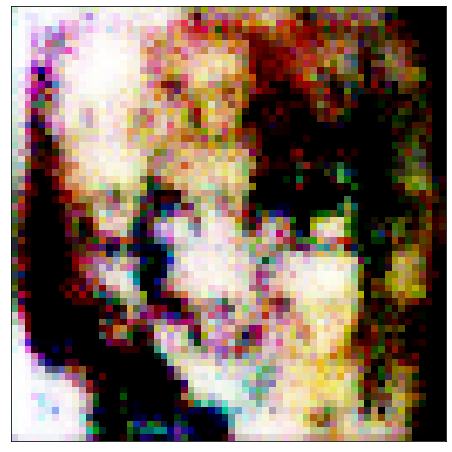

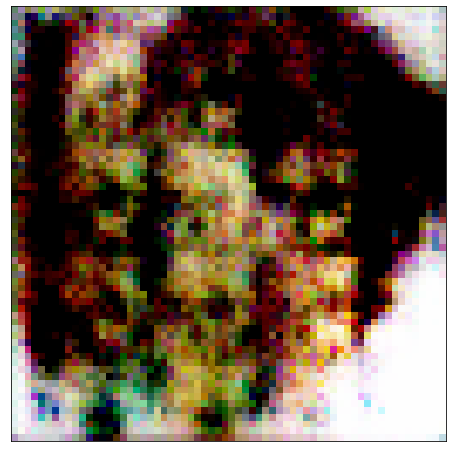

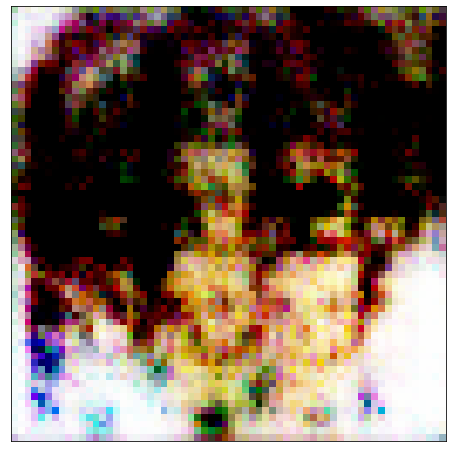

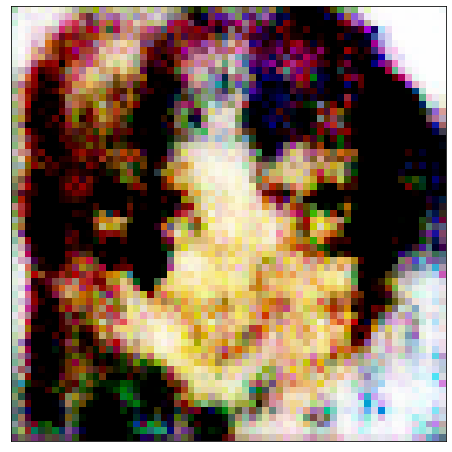

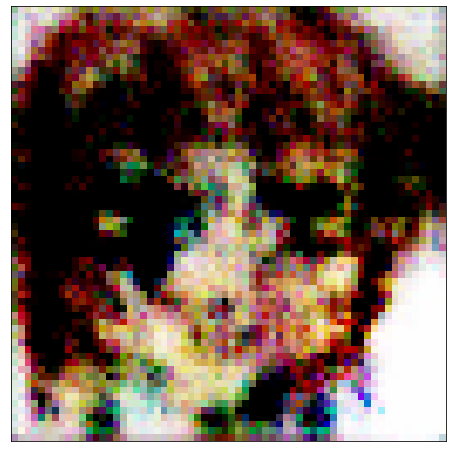

...

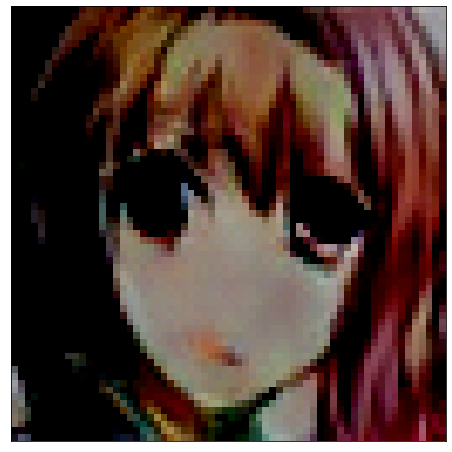

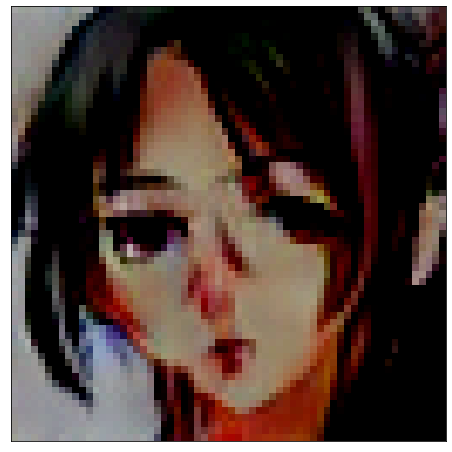

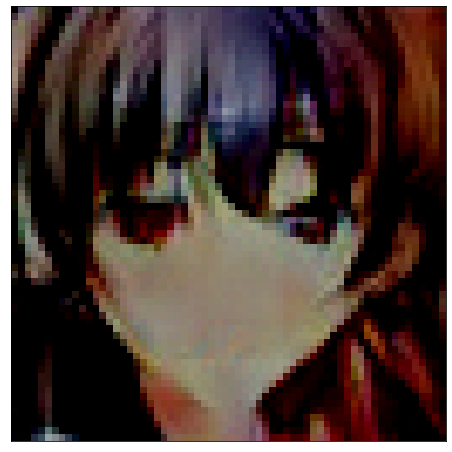

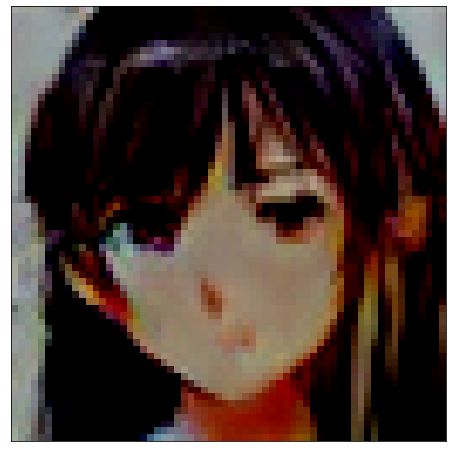

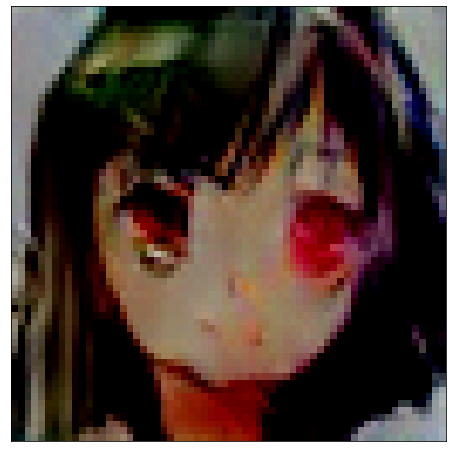

In [51]:
history = fit(epochs, lr)

In [52]:
losses_g, losses_d, real_scores, fake_scores = history

In [53]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [54]:
!cp "/content/generated" "/content/drive/My Drive/anime_generated"

cp: -r not specified; omitting directory '/content/generated'


In [55]:
from IPython.display import Image

# Image('./generated/generated-images-0001.png')
# Image('./generated/generated-images-0005.png')
# Image('./generated/generated-images-0010.png')
# Image('./generated/generated-images-0020.png')
# Image('./generated/generated-images-0040.png')

In [56]:
!pwd

/content


In [57]:
DATA_DIR = './generated'
print(os.listdir(DATA_DIR))

['generated-images-0000.png']


In [58]:
# Image('./generated/generated-images-0001.png')

In [59]:
# import cv2
# import os

# vid_fname = 'gans_training.avi'

# files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
# files.sort()

# out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
# [out.write(cv2.imread(fname)) for fname in files]
# out.release()

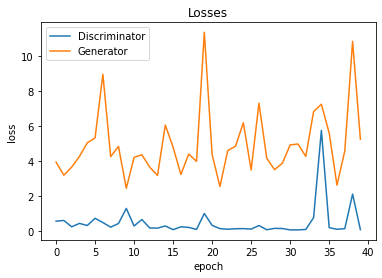

In [60]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');


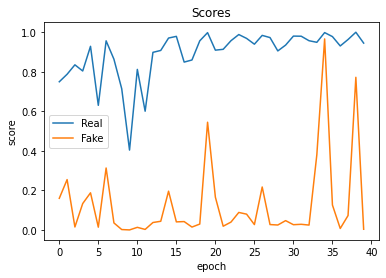

In [61]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');